In [6]:
#Librerías necesarias
import cv2
from matplotlib import pyplot as plt
import math
import numpy as np


(341, 256, 3)
(341, 256, 3)
(341, 256, 3)
(341, 256, 3)
(341, 256, 3)
(341, 256, 3)


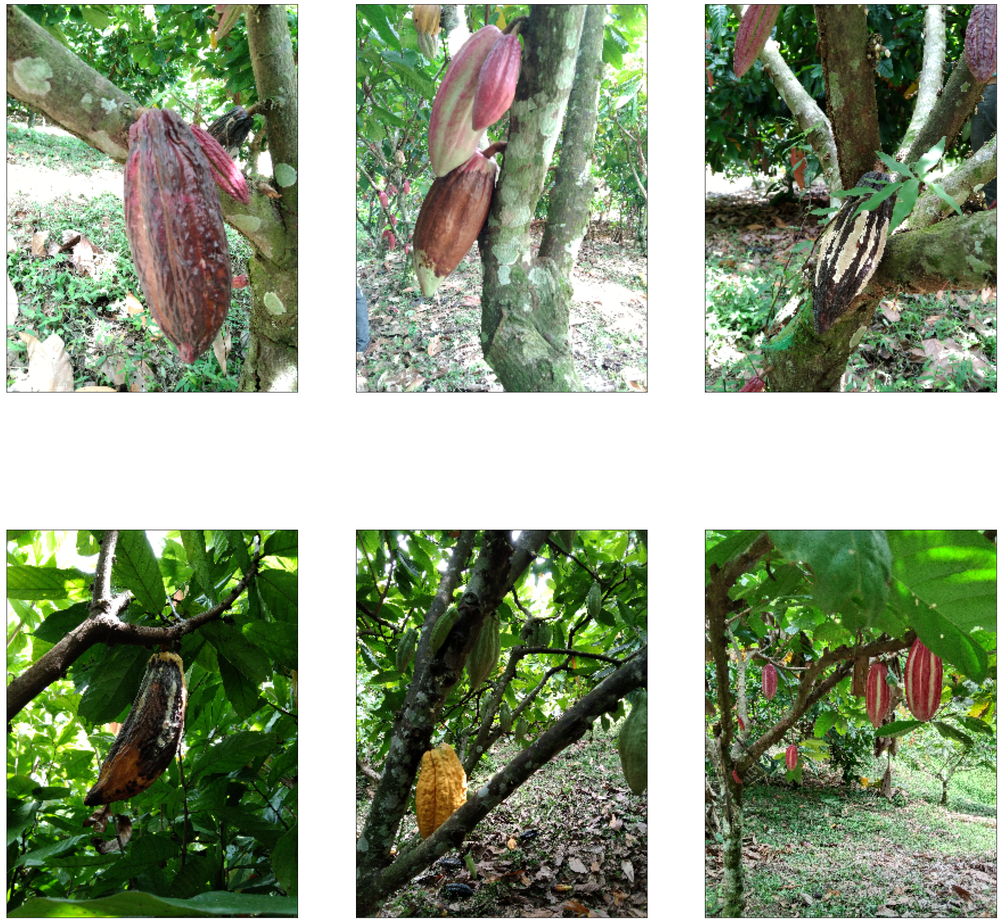

In [7]:
# Importacion de imagenes

# path
ruta='../../figs/imgsReto/'

# Pixeles del mínimo entre el ancho y el alto
minSize=256


# Importación de monilia
n_imag_monilia=2
imag_monilia=[]

for i in range(n_imag_monilia):
    imag_aux = cv2.imread(f'{ruta}Monilia/Monilia{i+1}.jpg')
    imag_aux=cv2.cvtColor(imag_aux,cv2.COLOR_BGR2RGB)
    
    n=imag_aux.shape[0]
    m=imag_aux.shape[1]

    escala= minSize/min(n,m)
    imag_aux= cv2.resize(imag_aux, None, fx=escala, fy= escala,\
                                interpolation= cv2.INTER_LINEAR)

    imag_monilia.append(imag_aux)


# Importacion de Phytophthora 

n_imag_fito=2
imag_fito=[]

for i in range(n_imag_fito):
    imag_aux = cv2.imread(f'{ruta}Fito/Fito{i+1}.jpg')
    imag_aux=cv2.cvtColor(imag_aux,cv2.COLOR_BGR2RGB)
    
    n=imag_aux.shape[0]
    m=imag_aux.shape[1]

    escala= minSize/min(n,m)
    imag_aux= cv2.resize(imag_aux, None, fx=escala, fy= escala,\
                                interpolation= cv2.INTER_LINEAR)


    imag_fito.append(imag_aux)
    

# Importación de cacao saludable

n_imag_healty=2
imag_healty=[]

favory_healty=range(n_imag_healty)

for i in favory_healty:
    imag_aux = cv2.imread(f'{ruta}Sana/Sana{i+1}.jpg')

    imag_aux=cv2.cvtColor(imag_aux,cv2.COLOR_BGR2RGB)
    
    n=imag_aux.shape[0]
    m=imag_aux.shape[1]

    escala= minSize/min(n,m)
    imag_aux= cv2.resize(imag_aux, None, fx=escala, fy= escala,\
                                interpolation= cv2.INTER_LINEAR)

    imag_healty.append(imag_aux)
    
## Se unen todas las imágenes y se haca un redimensionamiento
imagenes = imag_fito+imag_monilia+imag_healty


plt.figure(figsize=(30, 30))
for i in range(len(imagenes)):
    print(imagenes[i].shape)
    plt.subplot(math.ceil(len(imagenes)/3),3,i+1),plt.imshow(imagenes[i])
    plt.xticks([]),plt.yticks([])

plt.show()


El procedimiento general para hacer la segmentación por medio de color se toma de [Maindola2021]

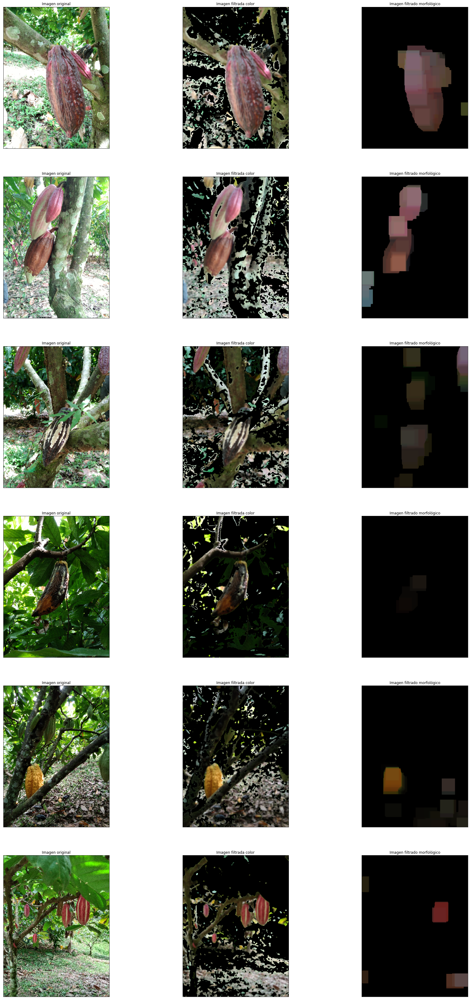

In [8]:
## Preprocesamiento
def filtroErosionesDilataciones(img,n_erosiones,n_dilataciones):
    ''' 
    img: Imagen en RGB
    n_erosiones: Número de Erosiones
    n_dilataciones: Número de dilataciones
    '''
    elemento_rectangular = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))
    kernel=elemento_rectangular
    
    opening = cv2.morphologyEx(img,cv2.MORPH_OPEN,kernel, iterations = 1)
    closing= cv2.morphologyEx(opening,cv2.MORPH_CLOSE,kernel, iterations = 1)

    
    
    img_erosion= cv2.erode(closing,kernel,iterations = n_erosiones)

    img_erosion_dilatacion=cv2.dilate(img_erosion,kernel,\
    iterations = n_dilataciones)

    return img_erosion_dilatacion

def filtroApertura(img,n_aperturas):
    ''' 
    img: Imagen en RGB
    n_erosiones: Número de Erosiones
    n_dilataciones: Número de dilataciones
    '''
    elemento_rectangular = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))
    kernel=elemento_rectangular
    
    opening = cv2.morphologyEx(img,cv2.MORPH_OPEN,kernel, iterations = 1)
    closing= cv2.morphologyEx(opening,cv2.MORPH_CLOSE,kernel, iterations = 1)

    opening = cv2.morphologyEx(closing,cv2.MORPH_OPEN,kernel, iterations = n_aperturas)
    return opening

def filtroCierre(img,n_cierres):
    ''' 
    img: Imagen en RGB
    n_erosiones: Número de Erosiones
    n_dilataciones: Número de dilataciones
    '''
    elemento_rectangular = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))
    kernel=elemento_rectangular
    
    opening = cv2.morphologyEx(img,cv2.MORPH_OPEN,kernel, iterations = 1)
    closing= cv2.morphologyEx(opening,cv2.MORPH_CLOSE,kernel, iterations = 1)

    closing = cv2.morphologyEx(closing,cv2.MORPH_CLOSE,kernel, iterations = n_cierres)
    return closing

image_blur = []
image_colorFilter= []
image_filter=[]

# Rango de color para eliminar el verde
light_green = (40, 40, 40)
dark_green = (70, 255, 255)

# Rango de color para eliminar la luz [rrr2]

light_white = (0, 0, 231)
dark_white = (180, 18, 255)

for i in range(len(imagenes)):
    # Filtro GaussianBlur
    image_blur.append(cv2.GaussianBlur(imagenes[i],(5,5),0))
    
    # Filtrado en verde
    # conversion a HSV (matiz, saturación, valor)
    image_blur_HSV= cv2.cvtColor(image_blur[i], cv2.COLOR_RGB2HSV)
    mask = cv2.inRange(image_blur_HSV, light_green, dark_green)
    result = cv2.bitwise_and(image_blur[i], image_blur[i], mask=mask)
    resultadoSinVerde=cv2.subtract(image_blur[i],result)

    # Filtrado en blanco
    mask = cv2.inRange(image_blur_HSV, light_white, dark_white)
    result = cv2.bitwise_and(image_blur[i], image_blur[i], mask=mask)
    resultadoSinBlanco=cv2.subtract(resultadoSinVerde,result)

    image_colorFilter.append(resultadoSinBlanco)
    # n_erosiones=math.ceil(math.log(closing.shape[0]*closing.shape[1]))
    # n_erosiones=7
    # n_dilataciones=7
    n_aperturas=15
    # n_cierres=15
  

    
    #image_filter.append(filtroErosionesDilataciones(image_colorFilter[i],\
    #    n_erosiones,n_dilataciones))

    image_filter.append(filtroApertura(image_colorFilter[i],n_aperturas))
    #image_filter.append(filtroCierre(image_colorFilter[i],n_cierres))


plt.figure(figsize=(30,60))
contador=0
for i in range(0,len(imagenes)*3,3):
    plt.subplot(len(imagenes),3,i+1),plt.imshow(imagenes[contador])
    plt.title('Imagen original'),plt.xticks([]),plt.yticks([])

    plt.subplot(len(imagenes),3,i+2),plt.imshow(image_colorFilter[contador])
    plt.title('Imagen filtrada color'),plt.xticks([]),plt.yticks([])

    plt.subplot(len(imagenes),3,i+3),plt.imshow(image_filter[contador])
    plt.title('Imagen filtrado morfológico'),plt.xticks([]),plt.yticks([])

    contador+=1
contador=0
plt.show()

In [9]:
# Contornos y áreas
def posMax(Vector):
    ''' 
    Calcula la posición del máximo componete del Vector
    Vector: nx1 vector para hallar el máximo
    '''
    return np.where(Vector == np.amax(Vector))[0][0]


def myThreshold(img_rbg):
    # Conversión a escala de grises
    gray=cv2.cvtColor(img_rbg, cv2.COLOR_RGB2GRAY) 

    # Umbralización 'adaptativa' con THRESH_OTSU
    # img_thr_THRESH_OTSU= cv2.threshold(img_gray_blur[i],0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
    # Umbralización con threshold
    
    return cv2.threshold(gray,3,255,0)[1] 

lisContours=[]
image_minAreaRect=[]
image_umbralizada=[]

for i in range(len(imagenes)):

    image_umbralizada.append(myThreshold(image_filter[i]))
    lisContours.append(cv2.findContours(\
            image_umbralizada[i],cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)[0])
    image_minAreaRect.append(imagenes[i].copy())
    # https://docs.opencv.org/4.5.5/dd/d49/tutorial_py_contour_features.html

    
    
    areas=np.array([],float)
    for contorno in lisContours[i]:        
        areas=np.append(areas,cv2.contourArea(contorno))

    ## Se elige la máxima área
    posicionMaximaArea=posMax(areas)


    rect = cv2.minAreaRect(lisContours[i][posicionMaximaArea])
    box = cv2.boxPoints(rect)
    box = np.int0(box)


    cv2.drawContours(image_minAreaRect[i], contours=[box],\
    contourIdx=-1, color=(0, 0, 255), thickness=2, lineType=cv2.LINE_AA)

    
    # cv2.drawContours(image_minAreaRect[i], contours=[box],\
    # contourIdx=0, color=(0, 0, 255), thickness=2, lineType=cv2.LINE_AA)



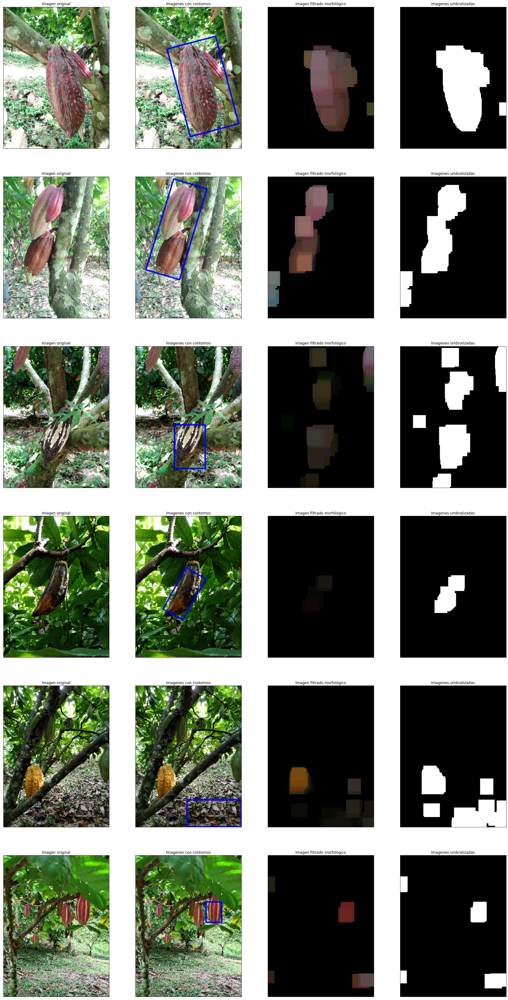

In [10]:
plt.figure(figsize=(30,60))
contador=0
n_imagenes=len(imagenes)
for i in range(0,n_imagenes*4,4):
    plt.subplot(n_imagenes,4,i+1),plt.imshow(imagenes[contador])
    plt.title('Imagen original'),plt.xticks([]),plt.yticks([])

    plt.subplot(n_imagenes,4,i+2),plt.imshow(image_minAreaRect[contador])
    plt.title('Imagenes con contornos'),plt.xticks([]),plt.yticks([])

    plt.subplot(n_imagenes,4,i+3),plt.imshow(image_filter[contador])
    plt.title('Imagen filtrado morfológico'),plt.xticks([]),plt.yticks([])

    plt.subplot(n_imagenes,4,i+4),plt.imshow(image_umbralizada[contador],cmap = 'gray')
    plt.title('Imagenes umbralizadas'),plt.xticks([]),plt.yticks([])

    contador+=1
plt.show()

## Referencias

